# Basic Graph Analysis


Graphs are described using basic and graph theoretical measures. Distribution of measures across the dataset are plotted.



In [1]:
import warnings
warnings.filterwarnings("ignore")
import glob
import os
import os.path as op
import sys
sys.path.append(
    '/Users/CN/Documents/Projects/Cambridge/cambridge_language_analysis/')

# Plotting
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# Data Processing
import numpy as np
import pandas as pd
import datetime
import re
# import gensim
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import collections
import networkx as nx


In [2]:
# SemanticSpeechGraph functions
from compile_graphs_dataset import get_graphs, graph_properties, exclude_empty_graphs
from graph_analysis_functions import print_bidirectional_edges, print_parallel_edges, get_parallel_edges
from word_embedding_analysis import central_words

In [3]:
# --------------------- Import graphs ---------------------------------------
graph_dir = '/Users/CN/Dropbox/speech_graphs/oasis'
output_figures = op.join(graph_dir, 'figures')

graphs, filelist = get_graphs(graph_dir)
graphs, filelist = exclude_empty_graphs(graphs, filelist, be_quiet=True)



Obtained 423 graphs. Excluded 0 empty graphs. Kept 423 graphs.


In [61]:
# --------------------- Import graph data ---------------------------------------
df = pd.read_csv(op.join(graph_dir, 'output/graph_data.csv'))
print('Described {0} graphs.\n{1} subjects described {2} ± {3} pictures.'.format(df.shape[0], len(df.subj.unique()), round(df.subj.value_counts().mean(),2), round(df.subj.value_counts().std(),2)))


# Make subj and tat categorical
df.subj = pd.Categorical(df.subj.astype('str'))
df.tat = pd.Categorical(df.tat.astype('str'))


id_data = pd.read_csv('/Users/CN/Documents/Projects/Cambridge/data/oasis/ids_oasis.csv', delimiter=';')
df['group'] = np.nan
for s, subj in enumerate(id_data.Subject):
    df.at[df.subj == str(subj), 'group'] = id_data.Group[s]

df.group = pd.Categorical(df.group.astype('str'))
df.group = df.group.cat.reorder_categories(
    ['CON', 'ARMS', 'FEP'])


print('--- Groups ---\n{}'.format(df.group.value_counts()))

Described 423 graphs.
53 subjects described 7.98 ± 0.14 pictures.
--- Groups ---
ARMS    191
FEP     128
CON     104
Name: group, dtype: int64


In [62]:
print('--- Groups ---\n{}'.format(df.group.value_counts()))

--- Groups ---
ARMS    191
FEP     128
CON     104
Name: group, dtype: int64


In [63]:
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(df[df.parallel_edges > 0]) / len(df) * 100, df[df.parallel_edges > 0].parallel_edges.mean()))

40.661939 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 1.482558


In [64]:
# ----------- Print Parallel edges -----------

# Print parallel edges
for G in graphs:
    print_parallel_edges(G, quiet=True)

# Get parallel edges (where the sentence matches)
list_of_all_pes = []
for G in graphs:
    parallel_edges = get_parallel_edges(G, same_sentence=True)
    list_of_all_pes.append(parallel_edges)

# Construct dataframe from all collected parallel edges
all_pes = pd.DataFrame(columns=['transcript', 'sent', 'n1', 'relation', 'n2'])
all_pes_df = pd.concat(list_of_all_pes)
all_pes_df.head()

# --- Optional: Save df as csv and manually check parallel edge validity ---
# all_pes_df.to_csv(graph_dir, 'output', parallel_edges.csv')
# --> Manual check of parallel edges suggests majority of parallel edges are valid

,transcript,sent,n1,relation,n2
0,s1_TLI_df_pic5,0,three men,sleeping,grass
1,s1_TLI_df_pic5,0,three men,to be,grass
0,s1_TLI_df_pic6,7,i,would be,it
1,s1_TLI_df_pic6,7,i,to know,it
0,s10_TLI_df_pic1,3,she,does not look to see,man


In [65]:
# ----------- Print bidirectional edges -----------
bidirectional_edges = []
for g, G in enumerate(graphs):
    # Get bidirectional edges
    n_bidirectional_edges = print_bidirectional_edges(G, quiet=True)
    bidirectional_edges.append(n_bidirectional_edges)
    # --> All bidirectional edges seem to be valid

In [66]:
total_bidirectional_edges = [n for n in bidirectional_edges if n is not None and n is not 0]
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(total_bidirectional_edges) / len(bidirectional_edges) * 100, sum(total_bidirectional_edges)/len(total_bidirectional_edges)))

69.976359 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 2.219595


# Plots

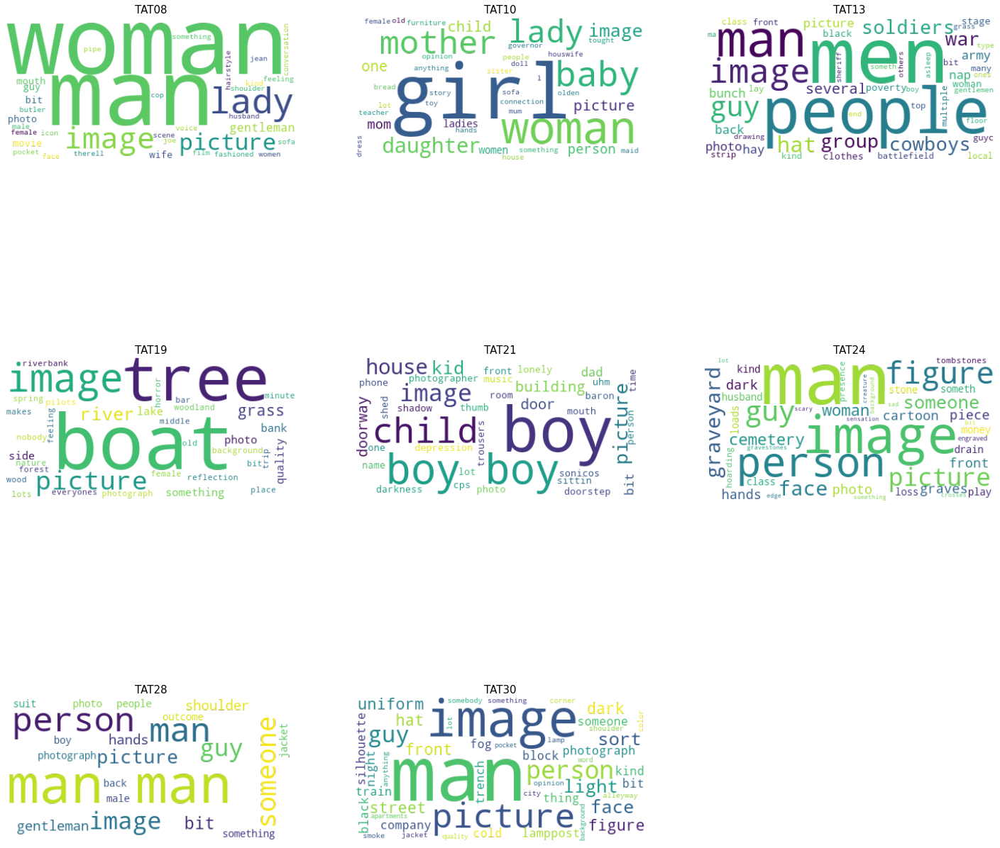

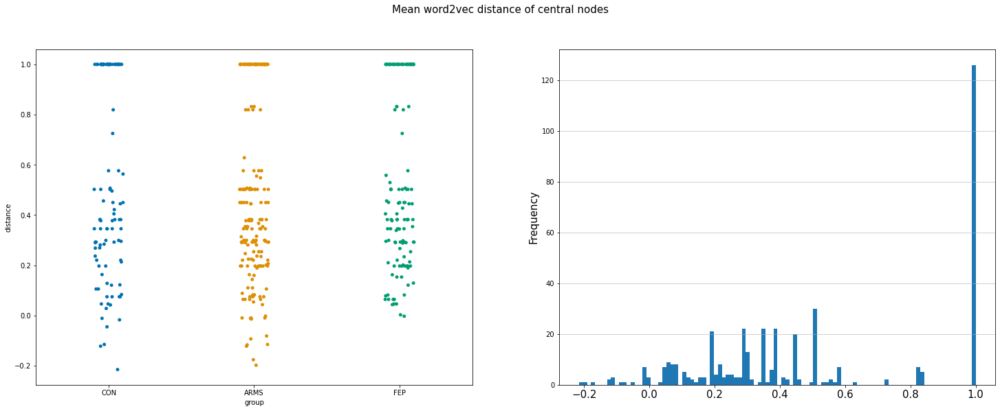

In [67]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Mean word2vec distance of central nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.stripplot(y='distance', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(df.distance, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_central_distances' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()


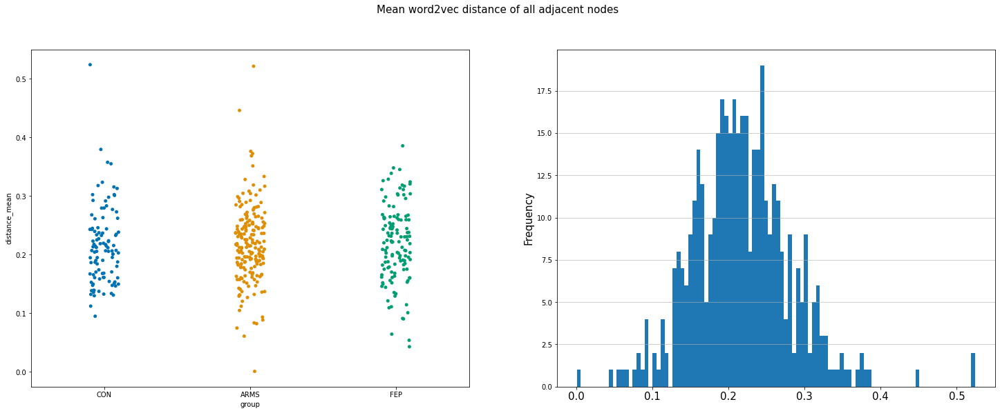

In [68]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Mean word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.stripplot(y='distance_mean', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(df.distance_mean, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

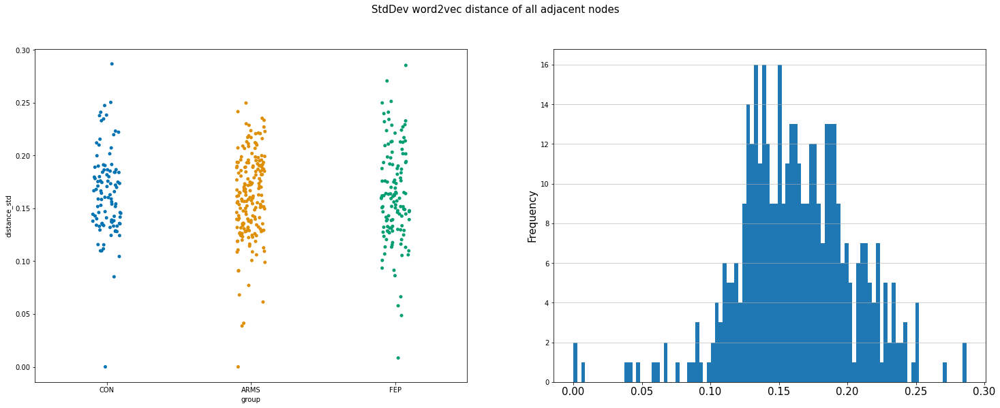

In [69]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('StdDev word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.stripplot(y='distance_std', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(df.distance_std, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances_std' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

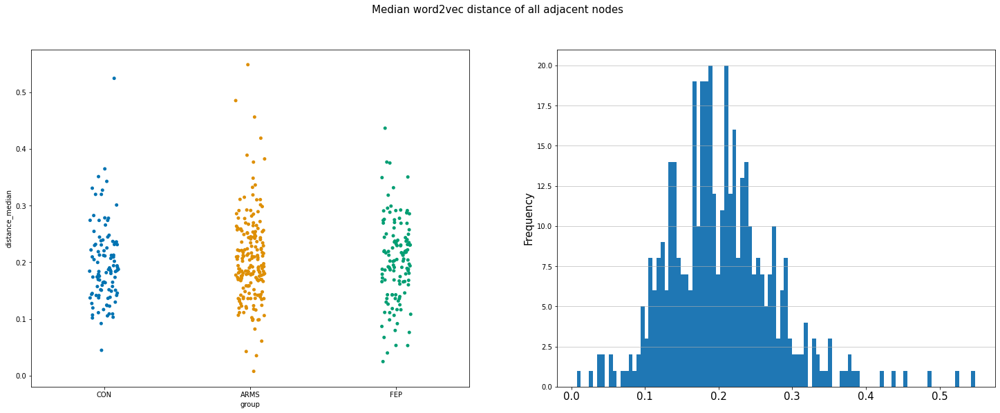

In [70]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Median word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.stripplot(y='distance_median', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(df.distance_median, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances_median' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

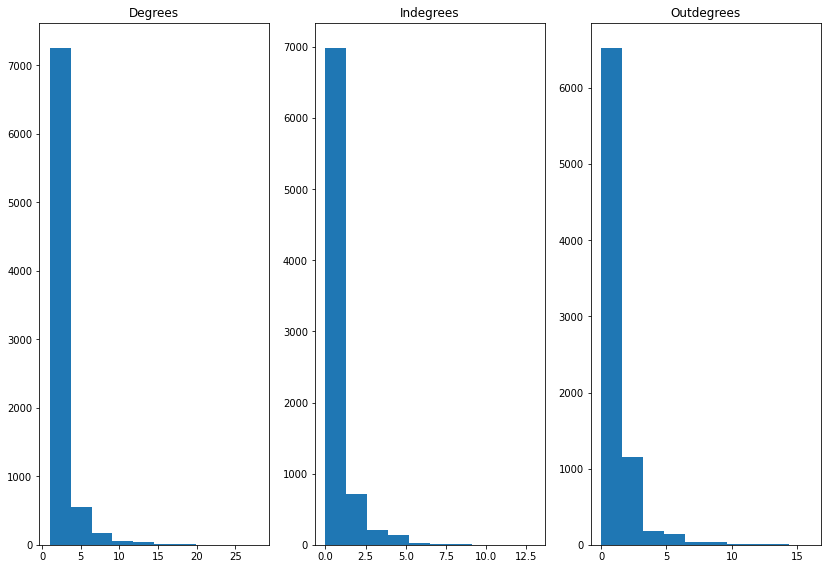

In [71]:
# --------------------- Degree distribution ---------------------------------------
#
degrees = []
in_degrees = []
out_degrees = []
for G in graphs:
    deg = [G.degree(n) for n in G.nodes()]
    degrees.extend(deg)
    outdeg = [G.out_degree(n) for n in G.nodes()]
    out_degrees.extend(outdeg)
    indeg = [G.in_degree(n) for n in G.nodes()]
    in_degrees.extend(indeg)

# Plot
fig = plt.figure(figsize=(14, 9.6))
ax = plt.subplot(1, 3, 1)
plt.hist(degrees)
plt.title('Degrees')
ax = plt.subplot(1, 3, 2)
plt.hist(in_degrees)
plt.title('Indegrees')
ax = plt.subplot(1, 3, 3)
plt.hist(out_degrees)
plt.title('Outdegrees')
# Save figure
output = op.join(output_figures, 'DegreeDistribution_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

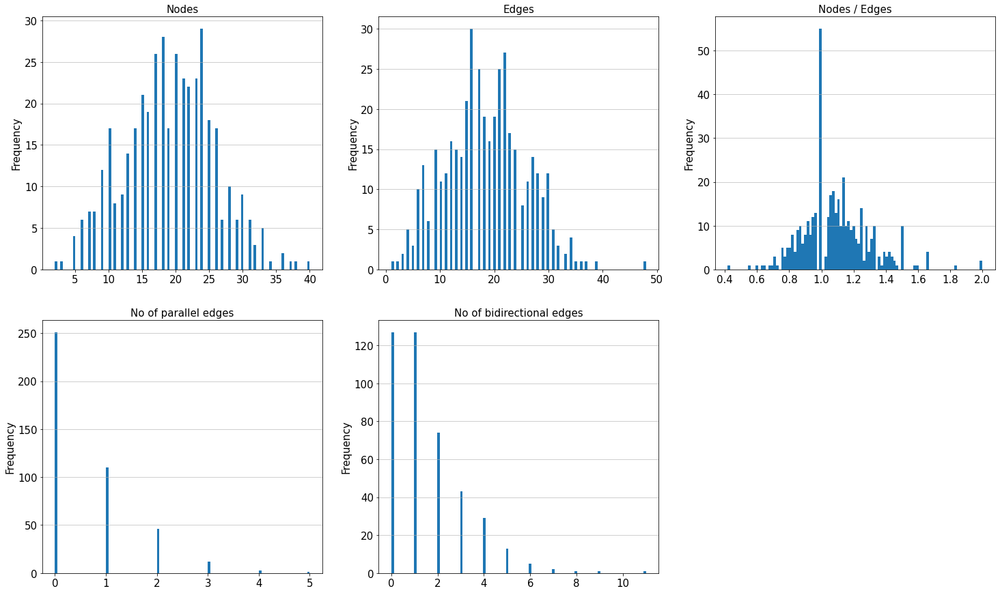

In [72]:

# ----------- Histogram: Nodes, Edges, Node-Edge ratio, Parallel edges -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))
# Nodes
ax = plt.subplot(2, 3, 1)
plt.hist(df.nodes, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes', fontsize=15)
# Edges
ax = plt.subplot(2, 3, 2)
plt.hist(df.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Edges', fontsize=15)
# Histogram Nodes/Edges ratio
ax = plt.subplot(2, 3, 3)
plt.hist(df.nodes / df.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes / Edges', fontsize=15)
# Parallel edges
ax = plt.subplot(2, 3, 4)
plt.hist(df.parallel_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of parallel edges', fontsize=15)
# Bidirectional edges
ax = plt.subplot(2, 3, 5)
plt.hist(df.bidirectional_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of bidirectional edges', fontsize=15)
# Save
output = op.join(output_figures, 'Hist_LCC-LSC_TAT' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

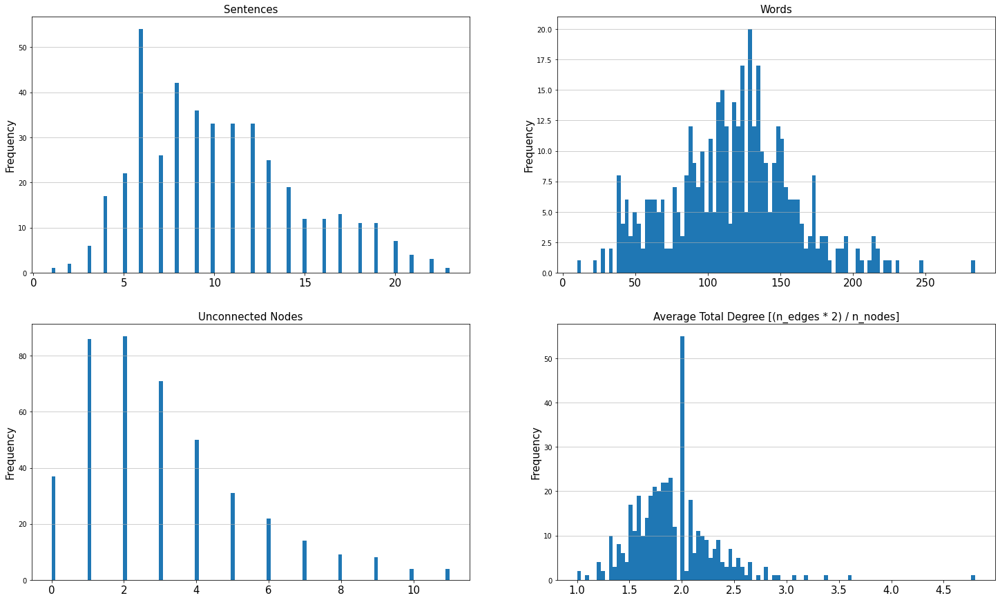

In [73]:

# ----------- Histogram -----------
# Sentences, Words, Unconnected Nodes, Average Total Degree,
fig = plt.figure(figsize=(25, 15))
# Sentences
ax = plt.subplot(2, 2, 1)
plt.hist(df.sentences, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Sentences', fontsize=15)
#
# Words
ax = plt.subplot(2, 2, 2)
plt.hist(df.words, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Words', fontsize=15)
#
# Unconnected Nodes
ax = plt.subplot(2, 2, 3)
plt.hist(df.unconnected, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Unconnected Nodes', fontsize=15)
#
# Average Total Degree
ax = plt.subplot(2, 2, 4)
plt.hist(df.average_total_degree, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Total Degree [(n_edges * 2) / n_nodes]', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_Basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

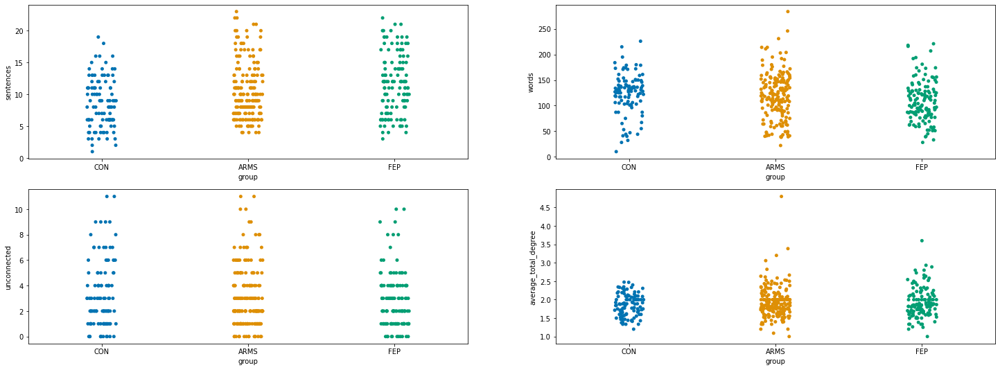

In [74]:
# ----------- stripplot for each group -----------
# Sentences, Words, Unconnected Nodes, Average Total Degree,
fig = plt.figure(figsize=(25, 9))
ax = plt.subplot(2, 2, 1)
sns.stripplot(y='sentences', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 2)
sns.stripplot(y='words', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 3)
sns.stripplot(y='unconnected', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 4)
sns.stripplot(y='average_total_degree', x='group',
              data=df,
              palette="colorblind",
              )

output = op.join(output_figures, 'Hist_group_Basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

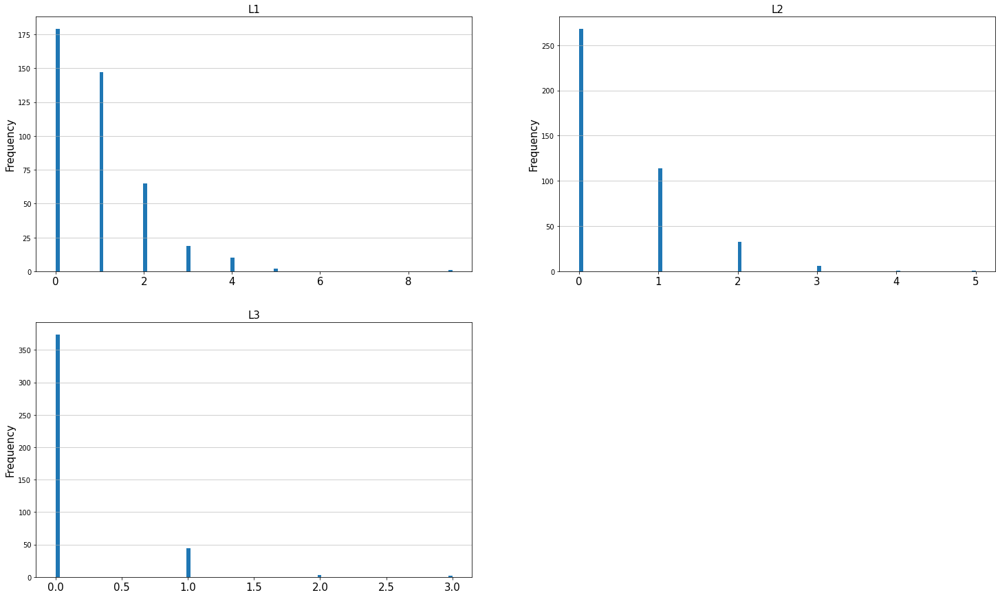

In [75]:
# ----------- Histogram -----------
# L1, L2, L3
fig = plt.figure(figsize=(25, 15))
# L1
ax = plt.subplot(2, 2, 1)
plt.hist(df.L1, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L1', fontsize=15)
#
# L2
ax = plt.subplot(2, 2, 2)
plt.hist(df.L2, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L2', fontsize=15)
#
# L3
ax = plt.subplot(2, 2, 3)
plt.hist(df.L3, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L3', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_L' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

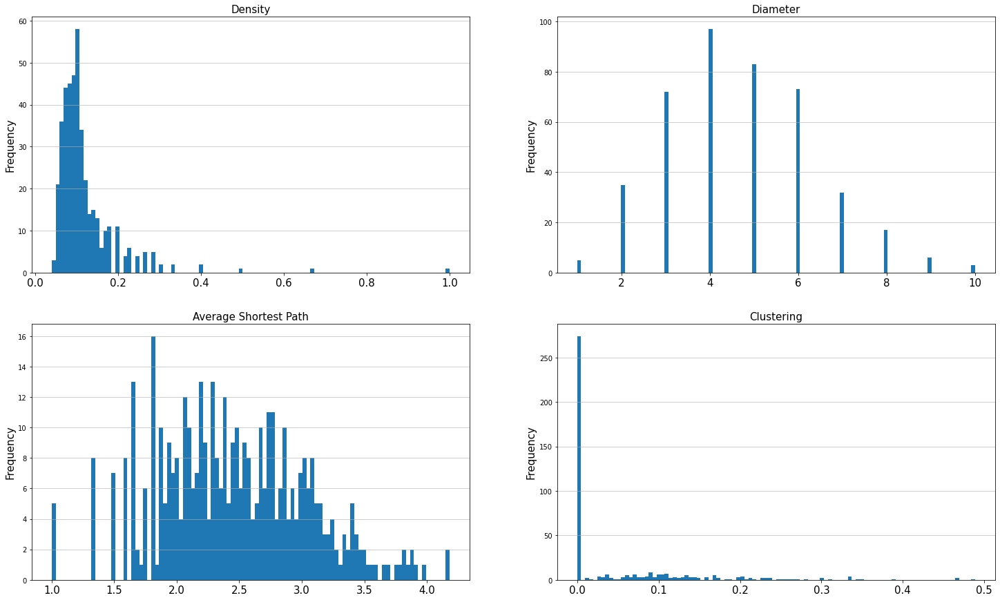

In [76]:
# ----------- Histogram -----------
# Density, Diameter, Average Shortest Path, Clustering,
fig = plt.figure(figsize=(25, 15))
# Density
ax = plt.subplot(2, 2, 1)
plt.hist(df.density, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Density', fontsize=15)
#
# Diameter
ax = plt.subplot(2, 2, 2)
plt.hist(df.diameter, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Diameter', fontsize=15)
#
# Average Shortest Path
ax = plt.subplot(2, 2, 3)
plt.hist(df.average_shortest_path, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Shortest Path', fontsize=15)
#
# Clustering
ax = plt.subplot(2, 2, 4)
plt.hist(df.clustering, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Clustering', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_UndirectedGraphProperties' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

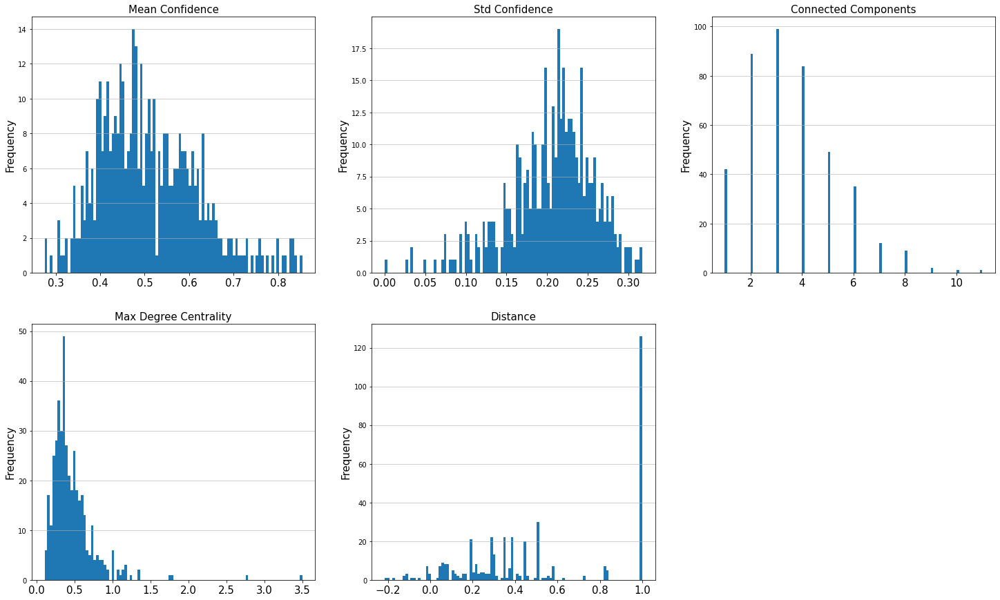

In [77]:

# ----------- Histogram -----------
# Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
fig = plt.figure(figsize=(25, 15))
# Mean Confidence
ax = plt.subplot(2, 3, 1)
plt.hist(df.mean_confidence[~np.isnan(df.mean_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Mean Confidence', fontsize=15)
#
# Std Confidence
ax = plt.subplot(2, 3, 2)
plt.hist(df.std_confidence[~np.isnan(df.std_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Std Confidence', fontsize=15)
#
# Connected Components
ax = plt.subplot(2, 3, 3)
plt.hist(df.connected_components, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Connected Components', fontsize=15)
#
# Max Degree Centrality
ax = plt.subplot(2, 3, 4)
plt.hist(df.max_degree_centrality, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Max Degree Centrality', fontsize=15)
#
# Distance
ax = plt.subplot(2, 3, 5)
plt.hist(df.distance[~np.isnan(df.distance)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Distance', fontsize=15)
# Save figure
output = op.join(output_figures, 'Hist_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

In [78]:
# # ----------- stripplot for each group -----------
# # Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
# fig = plt.figure(figsize=(25, 9))
# ax = plt.subplot(2, 3, 1)
# sns.stripplot(y='mean_confidence', x='group',
#               data=df,
#               palette="colorblind",
#               )
# ax = plt.subplot(2, 3, 2)
# sns.stripplot(y='std_confidence', x='group',
#               data=df,
#               palette="colorblind",
#               )
# ax = plt.subplot(2, 3, 3)
# sns.stripplot(y='connected_components', x='group',
#               data=df,
#               palette="colorblind",
#               )
# ax = plt.subplot(2, 3, 4)
# sns.stripplot(y='max_degree_centrality', x='group',
#               data=df,
#               palette="colorblind",
#               )
# ax = plt.subplot(2, 3, 5)
# sns.stripplot(y='distance', x='group',
#               data=df,
#               palette="colorblind",
#               )
# ax.set_xticklabels(frequent_words)

# output = op.join(output_figures, 'Hist_group_noTicks' +
#                  '_{0}'.format(str(datetime.date.today())))
# plt.savefig(output)
# plt.show(block=False)

NameError: name 'frequent_words' is not defined

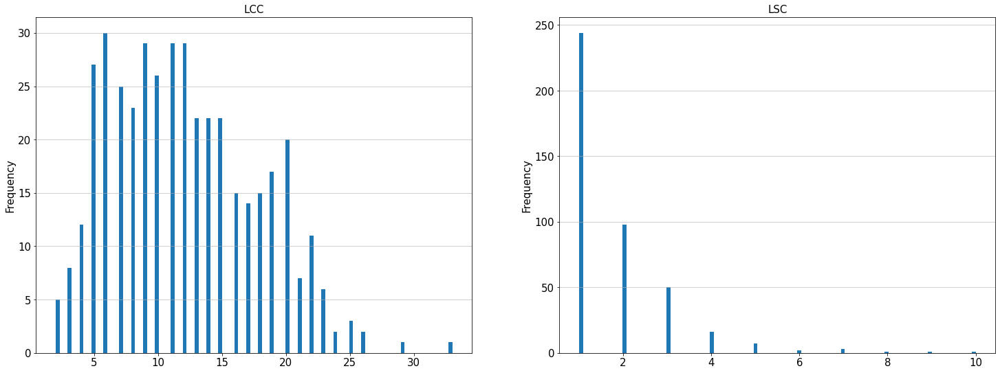

In [80]:

# ----------- Hist -----------
# LCC & LSC
fig = plt.figure(figsize=(25, 9))
# ---- LCC ----
# Set up the plot
ax = plt.subplot(1, 2, 1)
plt.hist(df.lcc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LCC', fontsize=15)
# ---- LSC ----
# Set up the plot
ax = plt.subplot(1, 2, 2)
plt.hist(df.lsc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LSC', fontsize=15)
output = op.join(output_figures, 'Hist_LCC-LSC' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

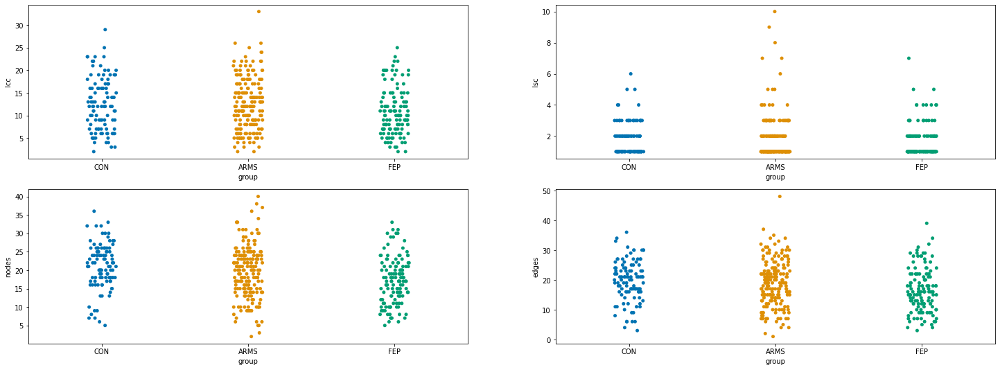

In [79]:
# ----------- LCC, LSC, Nodes, Edges by group -----------
fig = plt.figure(figsize=(25, 9))
ax = plt.subplot(2, 2, 1)
sns.stripplot(y='lcc', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 2)
sns.stripplot(y='lsc', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 3)
sns.stripplot(y='nodes', x='group',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 4)
sns.stripplot(y='edges', x='group',
              data=df,
              palette="colorblind",
              )
output = op.join(output_figures, 'Hist_LCC-LSC_group' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

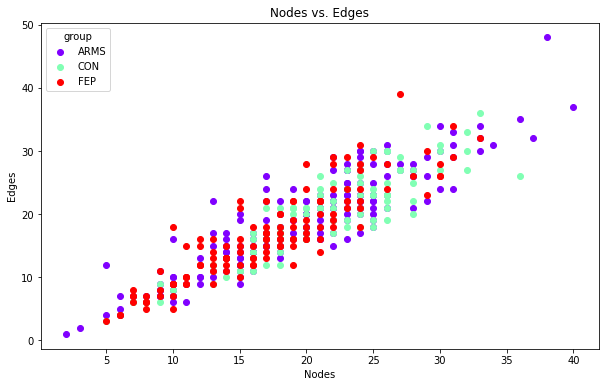

In [81]:

# ----------- Plot nodes vs edges -----------
fig, ax = plt.subplots(figsize=(10, 6))
groups = df.group.unique()
colors = cm.rainbow(np.linspace(0, 1, len(groups)))
for t, c in zip(groups, colors):
    plt.scatter(df[df.group == t].nodes, df[df.group == t].edges, color=c, label=t)

ax.legend(title="group")
plt.title('Nodes vs. Edges')
plt.xlabel('Nodes')
plt.ylabel('Edges')
output = op.join(output_figures, 'Nodes_vs_Edges' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

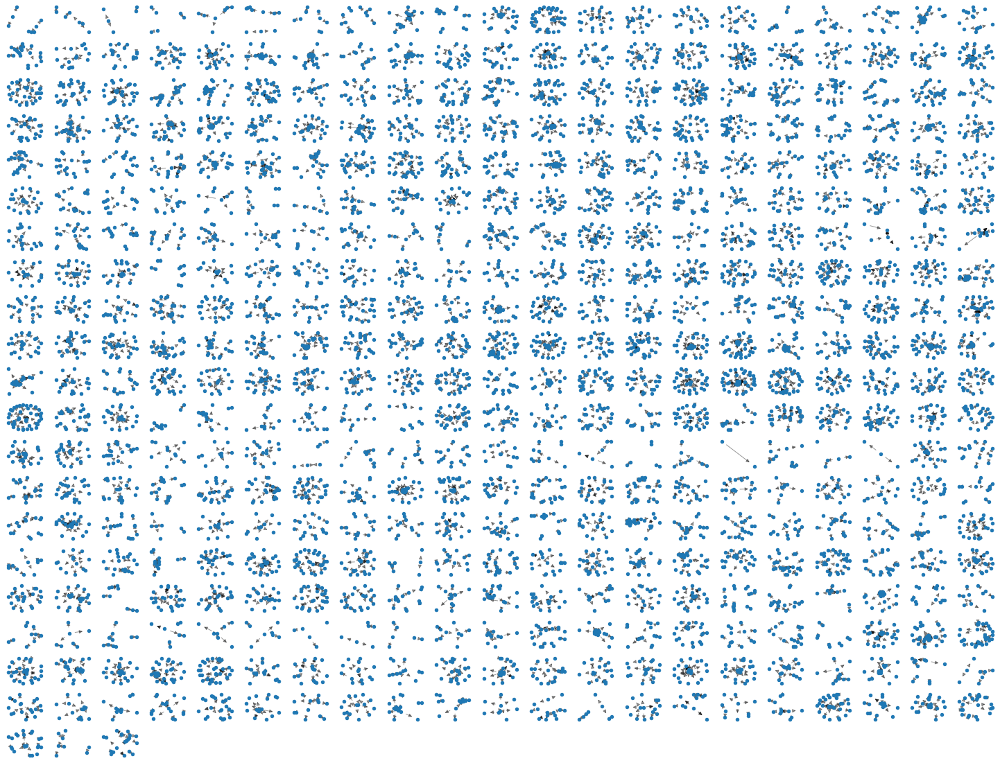

In [85]:

# --------------------- Raster Plot of all Graphs - with Groups colored ---------------------------------------
fig = plt.figure(figsize=(25.6, 20))
for g, G in enumerate(df_sorted.graph):
    ax = plt.subplot(np.ceil(np.sqrt(len(graphs))), np.ceil(np.sqrt(len(graphs))), g + 1)
    pos = nx.spring_layout(G)
    plt.axis("off")
    nx.draw_networkx_nodes(G, pos, node_size=20)
    nx.draw_networkx_edges(G, pos, alpha=0.4)

# --- Optional: Save plot --- 
output = op.join(output_figures, 'GraphsRaster' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

In [82]:
df_sorted = df
df_sorted['graph'] = graphs
df_sorted.sort_values(by=['group', 'subj'], ascending=[True, True], inplace=True, ignore_index=True)
# df_sorted.head()

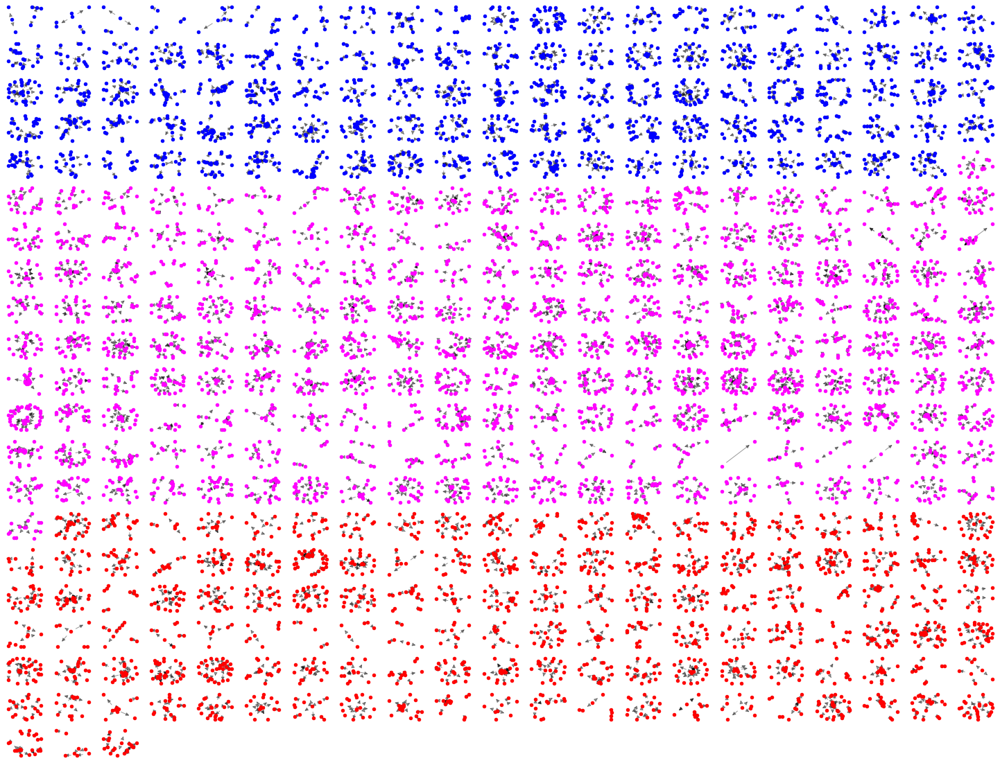

In [83]:

# --------------------- Raster Plot of all Graphs - with Groups colored ---------------------------------------
fig = plt.figure(figsize=(25.6, 20))
for g, G in enumerate(df_sorted.graph):
    ax = plt.subplot(np.ceil(np.sqrt(len(graphs))), np.ceil(np.sqrt(len(graphs))), g + 1)
    pos = nx.spring_layout(G)
    plt.axis("off")
    if df_sorted.group[g] == 'ARMS':
        c='magenta'
    elif df_sorted.group[g] == 'FEP':
        c='r'
    elif df_sorted.group[g] == 'CON':
        c='blue'
    nx.draw_networkx_nodes(G, pos, node_size=20, node_color=c)
    nx.draw_networkx_edges(G, pos, alpha=0.4)

# --- Optional: Save plot --- 
output = op.join(output_figures, 'GraphsRaster_ColoredPatients' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()